# Hierarchical Linear Model
The model comparison with theroetically motivated models which pose restrictions onto the parameter space can only inform us about the relative likelihood of these pre-selected models among each other. Fitting a model with less restrictions on the parameters can yield more insight into the data.

By design the data is ordered in categories. There are 3 clusters of participants belonging to different conditions. Every participant is performing 3 blocks with 30 trials. For each trial the parallel and orthogonal projection onto the UCM is measured. The data-generative process can, therefore, be expressed as a multi-level analysis.

In [1]:
# Basic imports and setup.

import sys
import logging
from pathlib import Path

from IPython.display import display
%load_ext autoreload
%autoreload 2

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
import seaborn as sns
import xarray as xr
pd.set_option("display.max_rows", 120)
pd.set_option("display.max_columns", 120)

from neuropsymodelcomparison.dataprocessing import analysis

logging.basicConfig(level=logging.INFO, stream=sys.stdout)

RANDOM_SEED = 2048
np.random.seed(386)

## Prepare Data
Get data.

In [2]:
# Common folder paths.
data_path = Path('../data/')
reports_path = Path('../reports/')
figures_path = reports_path / 'figures'

trial_data = pd.read_csv(data_path / 'preprocessed/trials.csv', index_col='id')
users_raw = pd.read_csv(data_path / 'raw/users.csv')
blocks_raw = pd.read_csv(data_path / 'raw/blocks.csv', index_col='id')
# We only analyze the first session of each participant.
df = trial_data.loc[trial_data['session'] == 1, ['user', 'condition', 'block_id', 'block', 'parallel', 'orthogonal']]
df['rating'] = df['block_id'].map(blocks_raw['rating'])
df['gaming_exp'] = df['user'].map(users_raw['gaming_exp'])
# Reshape data into long format.
df = df.melt(id_vars=['user', 'condition', 'block_id', 'block', 'gaming_exp', 'rating'], value_vars=['parallel', 'orthogonal'], var_name='direction', value_name='projection')
# Our predictors are categories.
df[['user', 'condition', 'block_id', 'block', 'direction']] = df[['user', 'condition', 'block_id', 'block', 'direction']].astype('category')
# Order categories.
block_order = [1, 2, 3]
df['block'].cat.reorder_categories(block_order, inplace=True)
condition_order = ['df1', 'df2', 'df1|df2']
df['condition'].cat.reorder_categories(condition_order, inplace=True)

Create local variables for readability and indexing.

In [3]:
conditions = df['condition'].cat.categories.tolist()
n_conditions = df['condition'].nunique()
condition_indices = df['condition'].cat.codes.values # Condition index for every single value.
condition_lookup = pd.Series(*pd.factorize(df['condition'].cat.categories), name='condition_idx_lookup')

# We need to be able to index by user. But the user IDs of the sample don't start at 0. We create an index and a mapping between them.
users = df['user'].cat.categories.tolist()
n_users = df['user'].nunique()
user_indices = df['user'].cat.codes.values  # User index for every single value.
user_lookup = pd.Series(*pd.factorize(df['user'].cat.categories), name='user_idx_lookup')
# User level predictors. More options: age group, gender.
# gaming_exp is not on an interval scale (no equidistance between items), but ordinal.
gaming_exp = df.drop_duplicates(subset="user")['gaming_exp']  # Shape = user_indices

# Block indices for 1,2,3.
blocks = df['block'].cat.categories.tolist()
n_blocks = df['block'].nunique()  # Same as using cat.categories.size
block_indices = df['block'].cat.codes.values # Block index for every single value.
block_lookup = pd.Series(*pd.factorize(df['block'].cat.categories), name='block_idx_lookup')
# Block ID indices. Shape = n_users * n_blocks.
block_ids = df['block_id'].cat.categories.tolist()
n_block_ids = df['block_id'].nunique()
block_id_indices = df['block_id'].cat.codes.values # Block index for every single value.
block_id_lookup = pd.Series(*pd.factorize(df['block_id'].cat.categories), name='block_id_idx_lookup')
# Block level predictors.
# Note: Ratings are correlated with block index.
ratings = df.drop_duplicates(subset=["user", 'block'])['rating']  # Shape = block_id_indices

# Coded direction of projection: 0 = orthogonal, 1 = parallel.
directions = df['direction'].cat.categories.tolist()
n_directions = df['direction'].nunique()
direction_indices = df['direction'].cat.codes.values
direction_lookup = pd.Series(*pd.factorize(df['direction'].cat.categories), name='direction_idx_lookup')

## Pooled Model (Direction)
Let's start with a simple model and build our way up. This model estimates differences in standard deviation between projection directions and across condition, blocks, and users.

In [4]:
# Coordinates to be used for dim keyword arguments and indexing InferenceData object.
coords = {'Direction': directions, 'obs_id': np.arange(direction_indices
.size)}

with pm.Model(coords=coords) as pooled_model:
    direction_idx = pm.Data('direction_idx', direction_indices, dims='obs_id')
    sigma = pm.Gamma('sigma', mu=4.0, sigma=2.0, dims='Direction')

    theta = sigma[direction_idx]

    projection = pm.Normal('projection', 0.0, sigma=theta, observed=df['projection'], dims='obs_id')

Having direction_idx as a Data object even though the variable direction_idx is not an observed variable nor a parameter of the model will tell ArviZ that direction_idx is information used by the model to index variables. ArviZ will thus include direction_idx as a variable in the constant_data group of the resulting InferenceData object. Moreover, including direction_idx in the [InferenceData](https://arviz-devs.github.io/arviz/notebooks/XarrayforArviZ.html) object makes sharing and reproducing analysis much easier, all the data needed to analyze or rerun the model is stored there.

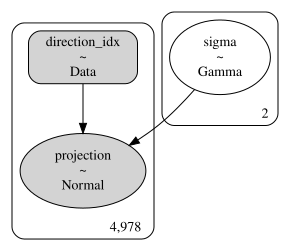

In [5]:
pm.model_to_graphviz(pooled_model)

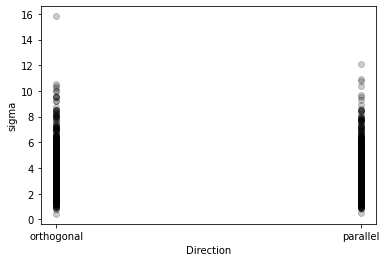

In [6]:
with pooled_model:
    prior_checks = pm.sample_prior_predictive(random_seed=RANDOM_SEED)
    idata_prior = az.from_pymc3(prior=prior_checks)

_, ax = plt.subplots()
idata_prior.prior.plot.scatter(x='Direction', y='sigma', color='k', alpha=0.2, ax=ax)

In [7]:
with pooled_model:
    pooled_trace = pm.sample(random_seed=RANDOM_SEED)
    pooled_idata = az.from_pymc3(pooled_trace)
    
az.summary(pooled_idata, round_to=2)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma]
INFO:pymc3:NUTS: [sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 10 seconds.
INFO:pymc3:Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 10 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
sigma[0],3.19,0.05,3.11,3.28,0.0,0.0,3849.84,3846.10,3851.72,3166.01,1.0
sigma[1],5.10,0.07,4.97,5.24,0.0,0.0,3672.96,3671.46,3636.20,3020.94,1.0


### Posterior Predictive Checks

In [8]:
with pooled_model:
    ppc = pm.sample_posterior_predictive(pooled_trace, random_seed=RANDOM_SEED)
    pooled_idata = az.from_pymc3(pooled_trace, posterior_predictive=ppc, prior=prior_checks)

In [9]:
#pooled_idata

### Highest Density Interval (HDI)
HDI for each level in projection direction. In the first group it will be the number of orthognal projection observations and in the second the number of parallel projection observations. We want ArviZ to reduce all dimensions in each groupby group.

In [10]:
hdi_helper = lambda ds: az.hdi(ds, input_core_dims=[['chain', 'draw', 'obs_id']])
hdi_ppc = pooled_idata.posterior_predictive['projection'].groupby(pooled_idata.constant_data['direction_idx']).apply(hdi_helper)['projection']
hdi_ppc

<xarray.DataArray 'projection' (direction_idx: 2, hdi: 2)>
array([[-6.02503739,  5.99343257],
       [-9.64569018,  9.55164502]])
Coordinates:
  * hdi            (hdi) <U6 'lower' 'higher'
  * direction_idx  (direction_idx) int64 0 1

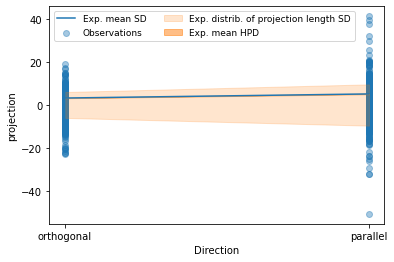

In [11]:
# ToDo: Fix plot. It's mixing observations of projection lengths with standard deviation on the same scale. It's not sensical.
direction_labels = pooled_idata.posterior['Direction'][pooled_idata.constant_data['direction_idx']]
pooled_idata.observed_data = pooled_idata.observed_data.assign_coords(Direction=direction_labels).sortby('Direction')

pooled_means = pooled_idata.posterior.mean(dim=('chain', 'draw'))

_, ax = plt.subplots()
pooled_idata.observed_data.plot.scatter(x='Direction', y='projection', label="Observations", alpha=0.4, ax=ax)

az.plot_hdi(
    [0, 1], hdi_data=hdi_ppc, fill_kwargs={'alpha': 0.2, 'label': "Exp. distrib. of projection length SD"}, ax=ax
)

az.plot_hdi(
    [0, 1], pooled_idata.posterior['sigma'], fill_kwargs={'alpha': 0.5, 'label': "Exp. mean HPD"}, ax=ax
)
ax.plot([0, 1], pooled_means['sigma'], label="Exp. mean SD")

ax.legend(ncol=2, fontsize=9, frameon=True)

## Unpooled Model (User x Direction)
This model estimates standard deviations for both directions of projection for each user independently, across conditions and blocks.

In [12]:

coords['User'] = users
with pm.Model(coords=coords) as unpooled_model:
    direction_idx = pm.Data('direction_idx', direction_indices, dims='obs_id')
    user_idx = pm.Data('user_idx', user_indices, dims='obs_id')
    sigma = pm.Gamma('sigma', mu=4.0, sigma=2.0, dims=('User', 'Direction'))

    theta = sigma[user_idx, direction_idx]

    projection = pm.Normal('projection', 0.0, sigma=theta, observed=df['projection'], dims='obs_id')

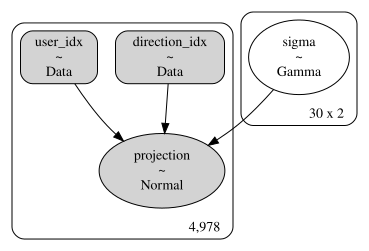

In [13]:
pm.model_to_graphviz(unpooled_model)

In [14]:
with unpooled_model:
    unpooled_idata = pm.sample(return_inferencedata=True, random_seed=RANDOM_SEED)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma]
INFO:pymc3:NUTS: [sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 51 seconds.
INFO:pymc3:Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 51 seconds.


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f30e6d035e0>,
      dtype=object)

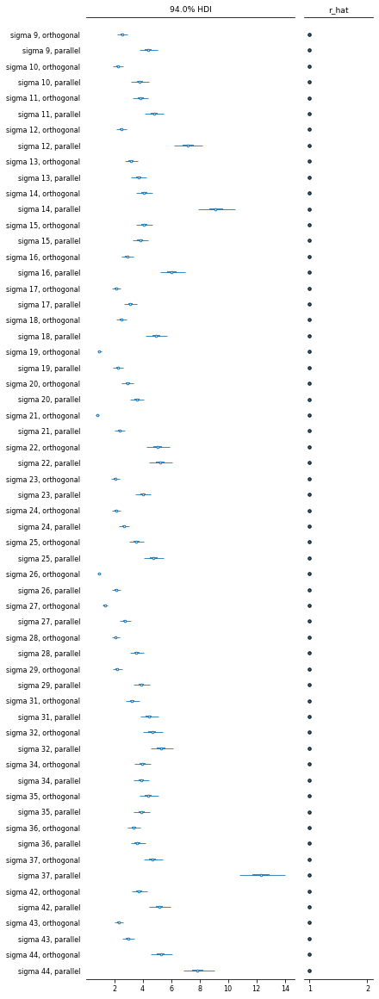

In [15]:
az.plot_forest(unpooled_idata, var_names='sigma', figsize=(6, 16), r_hat=True, combined=True, textsize=8)

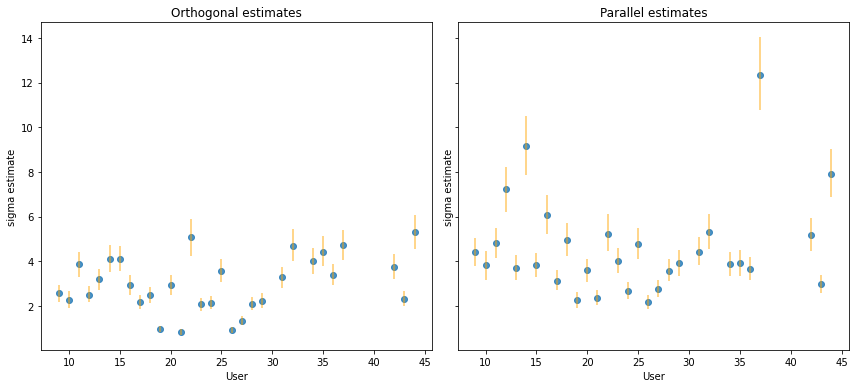

In [16]:
# ToDo: Fix plot sort means, xticktext.
unpooled_means = unpooled_idata.posterior.mean(dim=("chain", "draw"))
unpooled_hdi = az.hdi(unpooled_idata)

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharey=True)
fontdict = {"horizontalalignment": "right", "fontsize": 10}
for ax, dir_ in zip(axes, df['direction'].cat.categories.tolist()):
    unpooled_means_iter = unpooled_means.sel(Direction=dir_)#.sortby('sigma')
    unpooled_hdi_iter = unpooled_hdi.sel(Direction=dir_)#.sortby(unpooled_means_iter['sigma'])
    unpooled_means_iter.plot.scatter(x='User', y='sigma', ax=ax, alpha=0.8)
    ax.vlines(
        users,
        unpooled_hdi_iter['sigma'].sel(hdi="lower"),
        unpooled_hdi_iter['sigma'].sel(hdi="higher"),
        color="orange", alpha=0.6
    )
    ax.set(
        title=f"{dir_.title()} estimates",
        ylabel="sigma estimate",
    )
fig.tight_layout()

## Partial Pooling Model (User x Direction)
This model estimates standard deviations for both directions of projection for each user, across conditions and blocks. It assumes users are similar to each other by giving them a common prior. This is done to inform estimates about participants of whom we only have few valid measurements and to mitigate the weight of extreme values.

The intercepts are the deviations for the orthogonal projections. The slopes are the differences between parallel and orthogonal projection. They are defined as how much does the projection deviation change when direction goes from orthogonal (0) to parallel (1).

In [17]:

with pm.Model(coords=coords) as varying_intercept_slope:
    direction_idx = pm.Data('direction_idx', direction_indices, dims='obs_id')
    user_idx = pm.Data('user_idx', user_indices, dims='obs_id')

    # Hyperpriors:
    global_intercept = pm.Gamma('global_intercept', mu=4.0, sigma=2.0)
    global_intercept_sd = pm.Exponential('global_intercept_sd', 1.0)
    global_slope = pm.Normal('global_slope', mu=0.0, sigma=1.0)
    global_slope_sd = pm.Exponential('global_slope_sd', 0.5)

    # Varying intercepts:
    intercept_user = pm.Gamma('intercept_user', mu=global_intercept, sigma=global_intercept_sd, dims='User')
    # Varying slopes:
    slope_user = pm.Normal('slope_user', mu=global_slope, sigma=global_slope_sd, dims='User')

    # Expected deviation per user:
    theta = intercept_user[user_idx] + slope_user[user_idx] * direction_idx

    projection = pm.Normal('projection', 0.0, sigma=theta, observed=df['projection'], dims='obs_id')

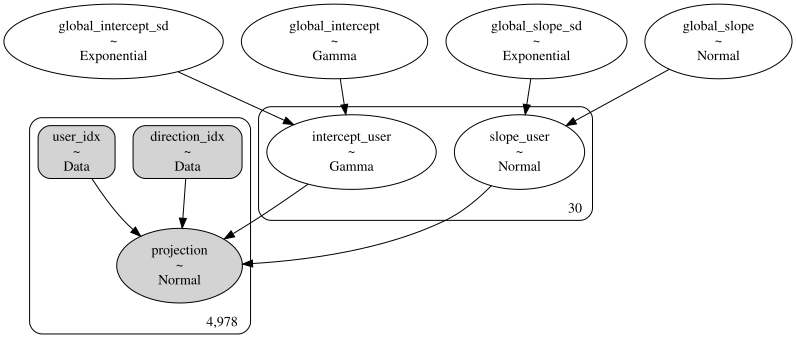

In [18]:
pm.model_to_graphviz(varying_intercept_slope)

In [19]:
with varying_intercept_slope:
    varying_intercept_slope_idata = pm.sample(2000, tune=2000, random_seed=RANDOM_SEED, return_inferencedata=True)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [slope_user, intercept_user, global_slope_sd, global_slope, global_intercept_sd, global_intercept]
INFO:pymc3:NUTS: [slope_user, intercept_user, global_slope_sd, global_slope, global_intercept_sd, global_intercept]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 93 seconds.
INFO:pymc3:Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 93 seconds.


sigma_slope estimates the dispersion across users of the intercepts and slopes.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f30e5fa8610>,
      dtype=object)

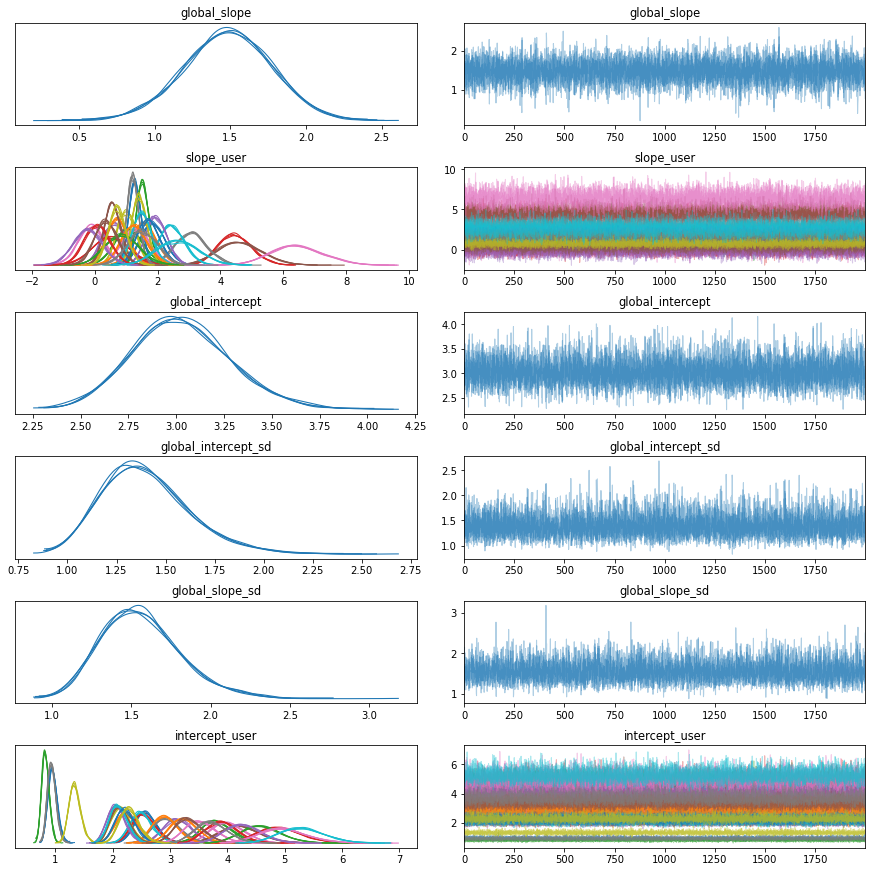

In [20]:
az.plot_trace(varying_intercept_slope_idata, compact=True, chain_prop={"ls": "-"})

Text(0.5, 1.0, 'SIGMA BY PARTICPANT')

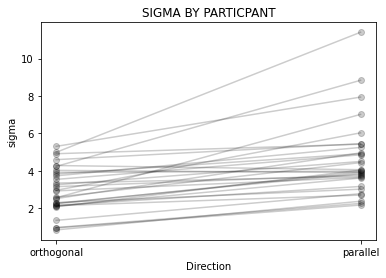

In [21]:
xvals = xr.DataArray([0, 1], dims="Direction", coords={"Direction": df['direction'].cat.categories.tolist()})
post = varying_intercept_slope_idata.posterior  # alias for readability
theta = (post.intercept_user + post.slope_user * xvals).mean(dim=("chain", "draw")).to_dataset(name="sigma")

_, ax = plt.subplots()
theta.plot.scatter(x="Direction", y="sigma", alpha=0.2, color="k", ax=ax) #scatter
ax.plot(xvals, theta["sigma"].T,"k-", alpha=0.2) # add lines too
ax.set_title("SIGMA BY PARTICPANT")

## Model (Block x User x Direction)

In [41]:
coords['Block_ID'] = block_ids  # 0..n_users*n_blocks
coords['Block'] = blocks  # 0..n_blocks
import theano.tensor as tt

with pm.Model(coords=coords) as by_block_model:
    user_idx = pm.Data('user_idx', user_indices, dims='obs_id')
    block_id_idx = pm.Data('block_id_idx', block_id_indices, dims='obs_id')
    block_idx = pm.Data('block_idx', block_indices, dims='obs_id')
    direction_idx = pm.Data('direction_idx', direction_indices, dims='obs_id')
    experience = pm.Data('experience', gaming_exp, dims='User')
    rating = pm.Data('rating', ratings, dims='Block_ID')  # Block has indices 0,1,2. But ratings are size of n_users*n_blocks. Try block_id?
    
    # Hyperpriors:
    global_intercept = pm.Gamma('global_intercept', mu=4.0, sigma=2.0)
    global_intercept_sd = pm.Exponential('global_intercept_sd', 1.0)
    global_slope = pm.Normal('global_slope', mu=1.5, sigma=1.0)  # We expect the slope to be positive most of the time.
    global_slope_sd = pm.Exponential('global_slope_sd', 0.5)

    # Users.
    # Varying intercepts per user:
    intercept_user = tt.tile(pm.Gamma('intercept_user', mu=global_intercept, sigma=global_intercept_sd, dims='User'), n_blocks)
    intercept_user_sd = tt.tile(pm.Exponential('intercept_user_sd', 1.0, dims='User'), n_blocks)
    # Varying slopes per user:
    slope_user = tt.tile(pm.Normal('slope_user', mu=global_slope, sigma=global_slope_sd, dims='User'), n_blocks)
    slope_user_sd = tt.tile(pm.Exponential('slope_user_sd', 1.0, dims='User'), n_blocks)

    # Blocks.
    # Varying intercepts per block:
    intercept_block = pm.Gamma('intercept_block', mu=intercept_user, sigma=intercept_user_sd, dims='Block_ID')
    # Varying slopes per block:
    slope_block = pm.Normal('slope_block', mu=slope_user, sigma=slope_user_sd, dims='Block_ID')

    # Expected deviation per block:
    theta = intercept_block[block_idx] + slope_block[block_idx] * direction_idx

    projection = pm.Normal('projection', 0.0, sigma=theta, observed=df['projection'], dims='obs_id')

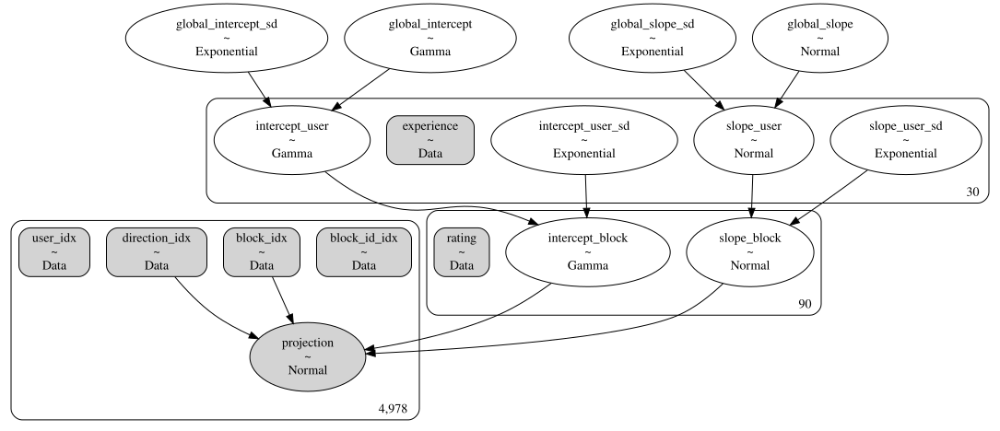

In [42]:
pm.model_to_graphviz(by_block_model)

In [50]:
with by_block_model:
    by_block_idata = pm.sample(2000, tune=2000, random_seed=RANDOM_SEED, return_inferencedata=True)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [slope_block, intercept_block, slope_user_sd, slope_user, intercept_user_sd, intercept_user, global_slope_sd, global_slope, global_intercept_sd, global_intercept]
INFO:pymc3:NUTS: [slope_block, intercept_block, slope_user_sd, slope_user, intercept_user_sd, intercept_user, global_slope_sd, global_slope, global_intercept_sd, global_intercept]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 1423 seconds.
INFO:pymc3:Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 1423 seconds.
There were 741 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 741 divergences after tuning. Increase `target_accept` or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
There were 1010 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 1010 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6528140200941379, but should be close to 0.8. Try to increase the number of tuning steps.
There were 943 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 943 divergences after tuning. Increase `tar